<a href="https://colab.research.google.com/github/Exusai/SuperResolutionWaifuNN/blob/master/SuperResolutionWaifu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%tensorflow_version 2.x

In [4]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

#Paths
path = '/content/drive/My Drive/DATA/Animu2x'
inputPath = path + '/AnimeGurPicsAtHalf'
outputPath = path + '/AnimeGurPics'
reSizedImagesPath = path + '/AnimeGurlPicsAtHalfRE'

imgURLS = !ls -1 '{inputPath}'
reimURL = !ls -1 '{reSizedImagesPath}'

n = 20
trainN = round(n * 0.80)

randomURLS = np.copy(imgURLS)
#np.random.seed(23)
np.random.shuffle(randomURLS)

trainURLS = randomURLS[: trainN]
testURLS = randomURLS[trainN : n]

print("images main: " + str(len(imgURLS)))
print("images new: " + str(len(reimURL)))
print(len(imgURLS), len(trainURLS), len(testURLS))

images main: 1448
images new: 1448
1448 16 4


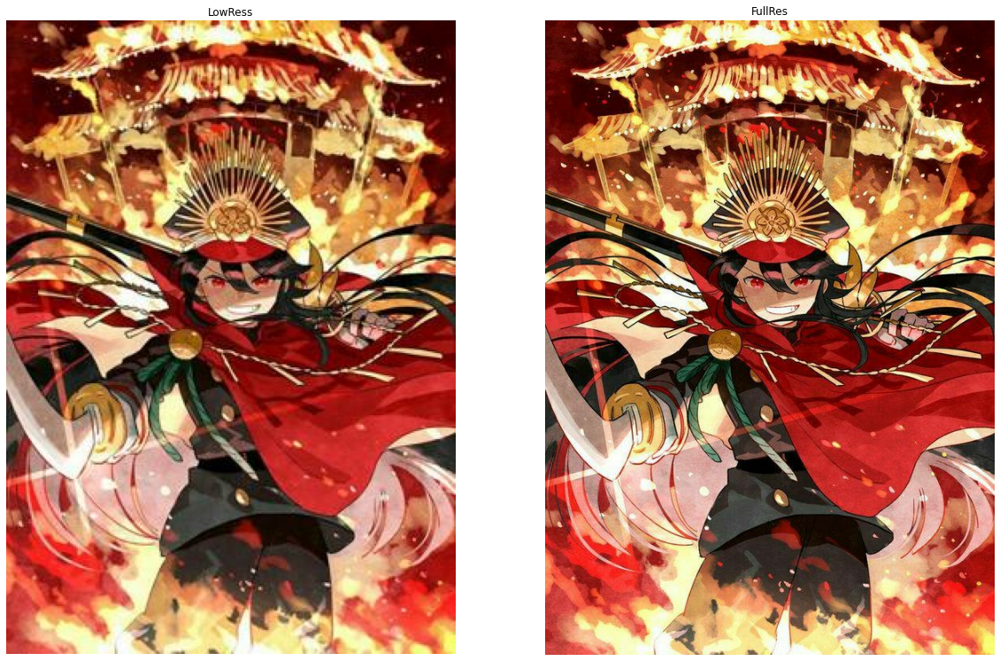

In [5]:
def resize(inimg, tgimg, HEIGHT, WIDTH):
  inimg = tf.image.resize(inimg, [HEIGHT, WIDTH])
  tgimg = tf.image.resize(tgimg, [HEIGHT, WIDTH])
  return inimg, tgimg

def normalize(inImage, targetImage):
  inImg = (inImage/127.5) - 1
  tarImg = (targetImage/127.5) - 1
  return inImg, tarImg

def loadImage(filename):
  inImg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(inputPath + '/' + filename)), tf.float32)[...,:3]
  outImg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(outputPath + '/' + filename)), tf.float32)[...,:3]
  inImg, outImg = normalize(inImg, outImg)
  return inImg, outImg

#Input Test
plt.figure(figsize = (20,20))
plt.subplot(1,2,1)
plt.title('LowRess')
plt.imshow((loadImage(trainURLS[3])[0] + 1) / 2)
plt.axis('off')
plt.subplot(1,2,2)
plt.title('FullRes')
plt.imshow((loadImage(trainURLS[3])[1] + 1) / 2)
plt.axis('off')
plt.show()

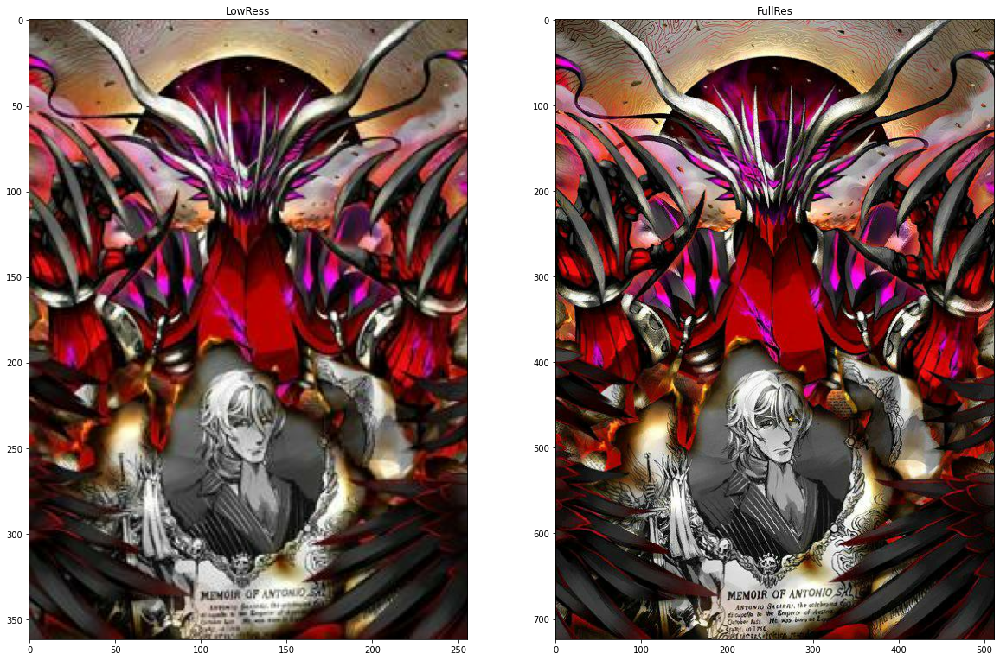

In [13]:
trainDataset = tf.data.Dataset.from_tensor_slices(trainURLS)
trainDataset = trainDataset.map(loadImage, num_parallel_calls = tf.data.experimental.AUTOTUNE)
trainDataset = trainDataset.batch(1)

testDataset = tf.data.Dataset.from_tensor_slices(testURLS)
testDataset = testDataset.map(loadImage, num_parallel_calls = tf.data.experimental.AUTOTUNE)
testDataset = testDataset.batch(1)

#test
for inimg, tgimg in testDataset.take(1):
  pass  
plt.figure(figsize = (20,20)) 
plt.subplot(1,2,1)
plt.title('LowRess')
plt.imshow(((inimg[0, ...]) + 1)/ 2)
plt.subplot(1,2,2)
plt.title('FullRes')
plt.imshow(((tgimg[0, ...]) + 1)/ 2)
plt.show()


In [8]:
from tensorflow.keras import *
from tensorflow.keras.layers import *

#initializer = tf.random_normal_initializer(0., 0.04)
#generator = models.Sequential()

#generator.add(tf.keras.layers.Input(shape = [None, None, 3]))

#generator.add(layers.Conv2D(16, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.BatchNormalization())
#generator.add(tf.keras.layers.Dropout(0.3))
#generator.add(tf.keras.layers.LeakyReLU())

#generator.add(layers.Conv2D(16, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.BatchNormalization())
#generator.add(tf.keras.layers.Dropout(0.3))
#generator.add(tf.keras.layers.LeakyReLU())

#generator.add(layers.Conv2D(32, (3, 3), padding='SAME', kernel_initializer = initializer)) 
#generator.add(tf.keras.layers.BatchNormalization())
#generator.add(tf.keras.layers.Dropout(0.4))
#generator.add(tf.keras.layers.LeakyReLU())

#generator.add(layers.Conv2D(32, (3, 3), padding='SAME', kernel_initializer = initializer)) 
#generator.add(tf.keras.layers.BatchNormalization())
#generator.add(tf.keras.layers.Dropout(0.4))
#generator.add(tf.keras.layers.LeakyReLU())

#generator.add(layers.Conv2D(64, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.LeakyReLU())
#generator.add(tf.keras.layers.BatchNormalization())
#generator.add(tf.keras.layers.Dropout(0.5))

#generator.add(layers.Conv2D(64, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.LeakyReLU())
#generator.add(tf.keras.layers.BatchNormalization())
#generator.add(tf.keras.layers.Dropout(0.5))

#generator.add(layers.Conv2D(128, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.LeakyReLU())
#generator.add(layers.Conv2D(128, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.LeakyReLU())

#generator.add(layers.Conv2D(256, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.LeakyReLU())
#generator.add(layers.Conv2D(256, (3, 3), padding='SAME', kernel_initializer = initializer))
#generator.add(tf.keras.layers.LeakyReLU())


#generator.add(layers.Conv2DTranspose(3, (3, 3), strides = 2, padding='SAME', activation = "tanh", kernel_initializer = initializer))

#print(generator.summary())

kerasFile = "SRNW6K.h5"
modelPath = '/content/drive/My Drive/DATA/Animu2x/models/new/' + kerasFile
generator = tf.keras.models.load_model(modelPath)
print(generator.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 16)    448       
_________________________________________________________________
batch_normalization (BatchNo (None, None, None, 16)    64        
_________________________________________________________________
dropout (Dropout)            (None, None, None, 16)    0         
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, None, None, 16)    0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 16)    2320      
_________________________________________________________________
batch_normalization_1 (Batch (None, None, None, 16)    64        
_________________________________________________________________
dropout_1 (Dropout)          (None, None, None, 16)    0

In [ ]:
#test untrained NN on testDataset
for inimg, tgimg in testDataset.take(4):
  pass  
genOutput = generator(((inimg + 1)* 255), training =  False) # 1rst test
#genOutput = generator(inimg, training =  False) # after TR test
#save image
#tf.keras.preprocessing.image.save_img(path + '/infTest/' + 'gilR64.png', genOutput[0, ...])
plt.figure(figsize = (10,10))
plt.imshow((genOutput[0,...]+1)/2)
plt.axis('off')
plt.show()
print('Input shape:',inimg.shape)
print('Output shape:',genOutput.shape)

In [ ]:
from IPython.display import clear_output
from tensorflow import keras

generatorOptimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)

def generatorLoss(genOutput, target):
  #mean absolute error
  genOutput, target = resize(genOutput, target, 800, 800)
  l1Loss = tf.reduce_mean(tf.abs(target - genOutput))
  totalGenLoss = l1Loss
  return totalGenLoss

def generateImages(model, testInput, tar, saveFilename = False, displayImages = True):
  prediction = model(testInput, training = False)
  
  if saveFilename:
    tf.keras.preprocessing.image.save_img(path + '/outputmodTest/' + saveFilename + '.jpg', prediction[0, ...])
  
  plt.figure(figsize = (20,20))
  displayList = [testInput[0], tar[0], prediction[0]]
  title = ["Input image", "Target", "2x image (prediction)"]

  if displayImages:
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      plt.imshow(displayList[i] * 0.5 + 0.5)
      plt.axis('off')
  plt.show()

#@tf.function()
def trainStep(inputImage, target):
  with tf.GradientTape() as genTape:
    outputImage = generator(inputImage, training = True)
    genLoss = generatorLoss(outputImage, target)
    generatorGrads = genTape.gradient(genLoss, generator.trainable_variables)
    generatorOptimizer.apply_gradients(zip(generatorGrads, generator.trainable_variables))

def train(dataset, epochs, lap):
  for epoch in range(epochs):
    imgi = 0
    for inputImage, target in dataset:
      print('epoch ' + str(epoch) + ' - train ' + str(imgi) + '/' + str(len(trainURLS)))
      imgi += 1
      trainStep(inputImage, target)
      clear_output(wait = True)
    
    if epoch % 100 == 0:
      kerasFile = "SRW4FIN.h5"
      modelPath = '/content/drive/My Drive/DATA/Animu2x/models/' + kerasFile
      keras.models.save_model(generator, modelPath)

      for inp, tar in testDataset.take(4):
          generateImages(generator, inp, tar, str(imgi) + '_' + str(epoch+(lap*100)), displayImages = True)
          imgi += 1

In [ ]:
#Makes shure that generated images during training are allways the same
testURLS = ['281.jpg','814.JPG','392.jpg','851.JPG']
testDataset = tf.data.Dataset.from_tensor_slices(testURLS)
testDataset = testDataset.map(loadImage, num_parallel_calls = tf.data.experimental.AUTOTUNE)
testDataset = testDataset.batch(1)

In [ ]:
#train(trainDataset, 1000)

In [ ]:
epochsPerBatch = 150
SE = 1
miniBatch = trainN

np.random.shuffle(randomURLS)

laps = len(randomURLS) // miniBatch
e = 0
for _ in range(SE):
  count = 0
  i = 0
  print('Epoch: ', e, '/', SE)
  for _ in range(laps):
    trainURLS = randomURLS[count:-(len(randomURLS) - miniBatch - count)]
    trainDataset = tf.data.Dataset.from_tensor_slices(trainURLS)
    trainDataset = trmainDataset.map(loadImage, num_parallel_calls = tf.data.experimental.AUTOTUNE)
    trainDataset = trainDataset.batch(1)
    try:    
      train(trainDataset, epochsPerBatch, i)
      count += miniBatch
      i += 1
      print(i, '/', laps)
    except:
      count += miniBatch
      i += 1
      print(i, '/', laps)
      print('ERROR')
  e += 1

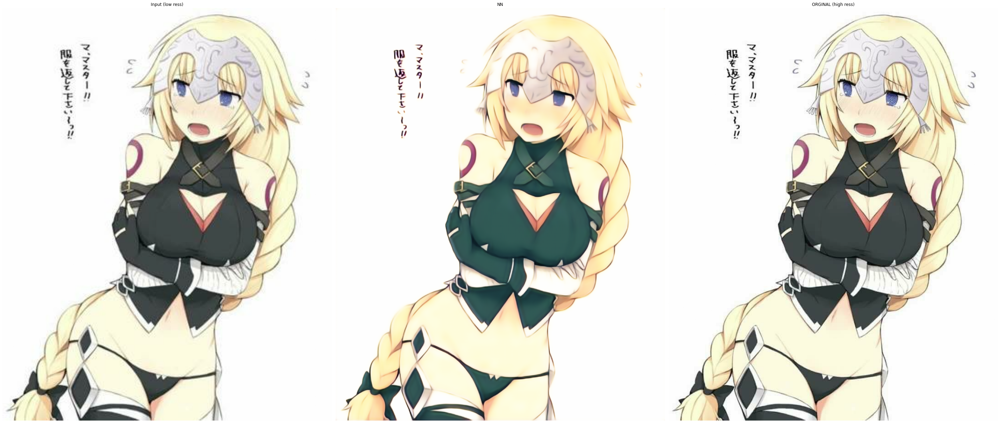

Input shape: (1, 509, 375, 3)   Output shape: (1, 902, 720, 3)    Original: (1, 1019, 750, 3)


In [23]:
#test on test dataset
for inimg, tgimg in testDataset.take(4):
  pass  
#genOutput = generator(((inimg + 1)* 255), training =  False) # 1rst test
genOutput = generator(inimg, training =  False) # after TR test
#save image
#tf.keras.preprocessing.image.save_img(path + '/infTest/' + 'gilR64.png', genOutput[0, ...])

fig, axs = plt.subplots(1, 3, figsize=(40,40))
axs[0].imshow(((inimg[0, ...]) + 1)/ 2)
axs[0].set_title('Input (low ress)')
axs[0].axis('off')
axs[1].imshow((genOutput[0,...]+1)/2)
axs[1].set_title('NN')
axs[1].axis('off')
axs[2].imshow(((tgimg[0, ...]) + 1)/ 2)
axs[2].set_title('ORGINAL (high ress)')
axs[2].axis('off')

plt.tight_layout()
#Save to image
#fig.savefig((modelsPath + 'test.png'))
plt.show()

print('Input shape:', trainIn.shape, ' ', 'Output shape:',genOutput.shape, '  ', 'Original:', traintr.shape)

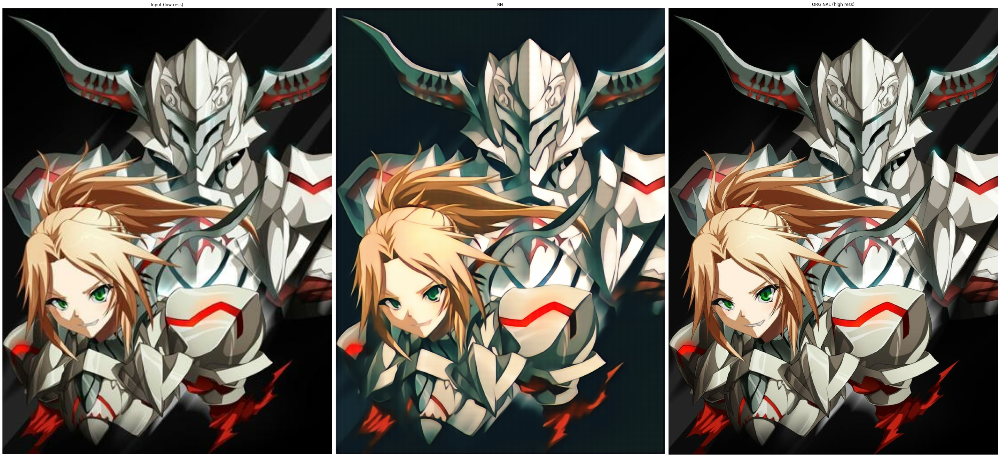

Input shape: (1, 509, 375, 3)   Output shape: (1, 1018, 750, 3)    Original: (1, 1019, 750, 3)


In [22]:
#Test on train dataset

for trainIn, traintr in trainDataset.take(3):
  pass

#genOutput = generator(((trainIn + 1)* 255), training =  False) # 1rst test
genOutput = generator(trainIn, training =  False) # after TR test
#Save image
#tf.keras.preprocessing.image.save_img(path + '/infTest/' + 'MOREJALTER.jpg', genOutput[0, ...])

fig, axs = plt.subplots(1, 3, figsize=(40,40))
axs[0].imshow(((trainIn[0, ...]) + 1)/ 2)
axs[0].set_title('Input (low ress)')
axs[0].axis('off')
axs[1].imshow((genOutput[0,...]+1)/2)
axs[1].set_title('NN')
axs[1].axis('off')
axs[2].imshow(((traintr[0, ...]) + 1)/ 2)
axs[2].set_title('ORGINAL (high ress)')
axs[2].axis('off')

plt.tight_layout()
#Save to image
#fig.savefig((modelsPath + 'test.png'))
plt.show()

print('Input shape:', trainIn.shape, ' ', 'Output shape:',genOutput.shape, '  ', 'Original:', traintr.shape)

In [ ]:
#Save keras file
"""from tensorflow import keras

kerasFile = "SRW3K.h5"
modelPath = '/content/drive/My Drive/DATA/Animu2x/models/' + kerasFile

keras.models.save_model(generator, modelPath)"""

In [ ]:
#Save tflite model
"""tfLiteModelPath = '/content/drive/My Drive/DATA/Animu2x/models/SRW2+.tflite'

converter = tf.lite.TFLiteConverter.from_keras_model(generator)

converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.experimental_new_converter = True
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

tflite_model = converter.convert()

open(tfLiteModelPath, "wb").write(tflite_model)"""